<a id="0"></a> <br>
 ### Оглавление  
1. [Описание данных](#1)
1. [Исследовательский анализ данных](#2)      
    1. [Первый взгляд на таблицы](#3)
    1. [Обработка оценок](#4)
    1. [Вывод](#5)
1. [Проверка данных](#6)
    1. [Вывод](#7)
1. [Векторизация изображений](#8)
1. [Векторизация текстов](#9)     
1. [Объединение векторов](#10)
    1. [Вывод](#11)      
1. [Обучение модели предсказания соответствия](#12)     
    1. [Linear regression](#13)     
    1. [Нейросеть](#14)     
    1. [Вывод](#15)
1. [Тестирование модели](#16)
    1. [CLIP](#18)     
1. [Вывод](#17)

# Прекод

# Сборный проект-4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.
<a id="12"></a>
### Описание данных

Данные лежат в папке `/datasets/image_search/` или доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.


Нам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.
<a id="12"></a>

### Описание данных

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

Загружу нужные библиотеки.

In [ ]:
import re
import nltk
import numpy as np
import pandas as pd
import tensorflow as tf
import spacy

from pathlib import Path
from matplotlib import pyplot as plt
from nltk.corpus import stopwords as nltk_stopwords

from PIL import Image
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import GroupShuffleSplit

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import image
from tqdm import tqdm, trange, notebook
from sklearn.model_selection import cross_val_score
import torch, torchvision
from torchvision import transforms

RNDSEED = 1
np.random.seed(RNDSEED)
tf.random.set_seed(RNDSEED)

Загружу все таблицы данных.

In [ ]:
path = 'to_upload/'

In [ ]:
df_train = pd.read_csv(Path(path, 'train_dataset.csv'))
df_crowd = pd.read_csv(Path(path, 'CrowdAnnotations.tsv'), sep='\t',
            names=['image', 'query_id', 'share_pos', 'count_pos', 'count_neg'])
df_expert = pd.read_csv(Path(path, 'ExpertAnnotations.tsv'), sep='\t',
            names=['image', 'query_id', '1', '2', '3'])
df_queries_test = pd.read_csv(Path(path, 'test_queries.csv'), index_col=[0], sep='|')
df_images_test = pd.read_csv(Path(path, 'test_images.csv'), sep='|')


<a id="2"></a>
## Исследовательский анализ данных

    Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

    В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

    Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

    В файле с краудсорсинговыми оценками информация расположена в таком порядке:

    1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
    2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
    3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

    После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

    Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


<a id="3"></a>
### Первый взгляд на таблицы

In [ ]:
display(df_train.head(), df_crowd.head(), df_expert.head(), df_queries_test.head(), df_images_test.head())

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


,image,query_id,share_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


,image,query_id,1,2,3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


In [ ]:
df_crowd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      47830 non-null  object 
 1   query_id   47830 non-null  object 
 2   share_pos  47830 non-null  float64
 3   count_pos  47830 non-null  int64  
 4   count_neg  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


In [ ]:
df_expert.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   1         5822 non-null   int64 
 3   2         5822 non-null   int64 
 4   3         5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


In [ ]:
df_queries_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


In [ ]:
df_images_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes


In [ ]:
print('Уникальных фотографий в тренировочном сете:', len(df_train['image'].unique()))

Уникальных фотографий в тренировочном сете: 1000


In [ ]:
print('Уникальных фотографий в тестовом сете:', len(df_images_test['image'].unique()))

Уникальных фотографий в тестовом сете: 100


Посмотрим на дубли в тренировочном сете и в оценках.

In [ ]:
df_train.duplicated().sum()

0

In [ ]:
df_crowd.duplicated().sum()

0

In [ ]:
df_expert.duplicated().sum()

0

Дублей нет.

In [ ]:
print('Уникальных текстовых описаний в трейне:', len(df_train['query_text'].unique()))
print('Уникальных текстовых описаний в тесте:', len(df_queries_test['query_text'].unique()))

Уникальных текстовых описаний в трейне: 977
Уникальных текстовых описаний в тесте: 500


Теперь выборочно посмотрим на фотографии.

In [ ]:
foto_train_sample = list(df_train['image'].sample(8))
foto_test_sample = list(df_queries_test['image'].sample(8))

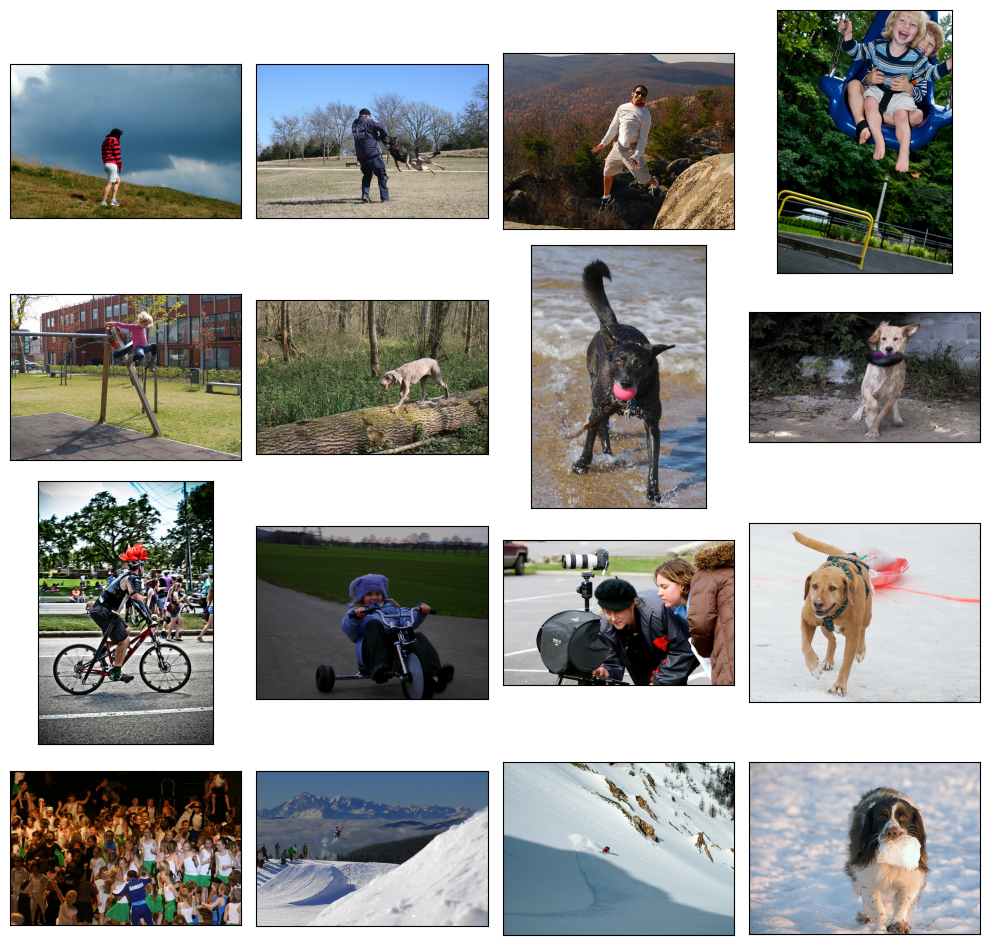

In [ ]:
fig = plt.figure(figsize=(10,10))
for i in range(8):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(path, 'train_images', foto_train_sample[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
for i in range(8):
    fig.add_subplot(4, 4, i+9)
    image = Image.open(Path(path, 'test_images', foto_test_sample[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Обычные фото.

<a id="4"></a>
### Обработка оценок

Для экспертных оценок действуем таким образом - создаём новый столбец, куда помещаем оценку, которая встречается два раза из трёх или оставляем ячейку пустой, если все три оценки разные.

In [ ]:
def score_avg(s1, s2, s3):
    if s1==s2 or s1==s3:
        return s1
    elif s2==s3:
        return s2
    else:
        return np.nan


In [ ]:
df_expert['score_avg'] = df_expert.apply(lambda x: score_avg(x['1'], x['2'], x['3']), axis=1)

In [ ]:
df_expert.head()

,image,query_id,1,2,3,score_avg
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,1.0
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,2.0
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,1.0


Теперь приведём оценку к масштабу [0,1].

In [ ]:
scaler = MinMaxScaler()

In [ ]:
df_expert[['score_exp']] = scaler.fit_transform(df_expert[['score_avg']])

In [ ]:
df_expert.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      5822 non-null   object 
 1   query_id   5822 non-null   object 
 2   1          5822 non-null   int64  
 3   2          5822 non-null   int64  
 4   3          5822 non-null   int64  
 5   score_avg  5696 non-null   float64
 6   score_exp  5696 non-null   float64
dtypes: float64(2), int64(3), object(2)
memory usage: 318.5+ KB


Из краудсорсинговой оценки вполне подойдёт доля людей, решивших, что изображение соответствует описанию.


In [ ]:
df_expert.head()

,image,query_id,1,2,3,score_avg,score_exp
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1.0,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1.0,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,1.0,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,2.0,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,1.0,0.000000


Строки с тремя разными оценками удаляем.

In [ ]:
df_expert = df_expert.dropna(subset=['score_avg'])

In [ ]:
df_expert.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5696 entries, 0 to 5821
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      5696 non-null   object 
 1   query_id   5696 non-null   object 
 2   1          5696 non-null   int64  
 3   2          5696 non-null   int64  
 4   3          5696 non-null   int64  
 5   score_avg  5696 non-null   float64
 6   score_exp  5696 non-null   float64
dtypes: float64(2), int64(3), object(2)
memory usage: 356.0+ KB


Теперь объединим оба сета оценок с сохранением всех вариантов.

In [ ]:
df_scores = pd.merge(df_expert, df_crowd, how='outer', on=['image', 'query_id'])

In [ ]:
df_scores = df_scores.drop(['1', '2', '3', 'score_avg', 'count_pos', 'count_neg'], axis=1)

In [ ]:
df_scores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51268 entries, 0 to 51267
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      51268 non-null  object 
 1   query_id   51268 non-null  object 
 2   score_exp  5696 non-null   float64
 3   share_pos  47830 non-null  float64
dtypes: float64(2), object(2)
memory usage: 1.6+ MB


In [ ]:
df_scores.head()

,image,query_id,score_exp,share_pos
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000000,0.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000000,0.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000000,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.333333,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000000,NaN


Теперь нужно усреднить данные. Там, где встречаются пустоты, возьмём существующую оценку, а там, где есть обе, возьмём оценку эксперта с весом 0.6, а краудсорсинговую с весом 0.4.

In [ ]:
def score(s1, s2):
    if np.isnan(s1):
        return round(s2, 2)
    elif np.isnan(s2):
        return round(s1, 2)
    else:
        return round(s1*0.6+s2*0.4, 2)

In [ ]:
df_scores['score'] = df_scores.apply(lambda x: score(x['score_exp'], x['share_pos']), axis=1)

In [ ]:
df_scores = df_scores.drop(['score_exp', 'share_pos'], axis=1)

In [ ]:
df_scores.head()

,image,query_id,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.00
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.00
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.00
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.33
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.00


Скопирую часть тренировочного сета для дальнейшей работы по заполненио описаний.

In [ ]:
fill_text = df_train.copy().drop('image', axis=1)

Теперь добавим оценку в тренировочный сет.

In [ ]:
df_train = (df_train.set_index(['image', 'query_id']).join(df_scores.set_index(['image', 'query_id'])[['score']],
            how='outer',).reset_index())

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51323 non-null  object 
 1   query_id    51323 non-null  object 
 2   query_text  5822 non-null   object 
 3   score       51268 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.6+ MB


Теперь надо к этому сету присоединить текстовые описания.

Извлекаю имена файлов, которым даны описания, из идентификаторов описаний и получаю оригинальные пары фото-описание.

In [ ]:
fill_text['q_id'] = fill_text['query_id'].str[:-2]

In [ ]:
fill_text = fill_text.drop(['query_id'], axis=1)

In [ ]:
fill_text = fill_text.drop_duplicates()

In [ ]:
fill_text.info()

<class 'pandas.core.frame.DataFrame'>
Index: 977 entries, 0 to 5821
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_text  977 non-null    object
 1   q_id        977 non-null    object
dtypes: object(2)
memory usage: 22.9+ KB


In [ ]:
def fillna_text(row):

    if pd.isnull(row['query_text']):

        text = fill_text[fill_text['q_id'] == row['query_id'][:-2]]['query_text']
        #может случиться так, что соответствия нет, тогда text будет пустым
        if len(text) > 0:
            row['query_text'] = text.iloc[0]

    return row

In [ ]:
df_train = df_train.apply(fillna_text, axis=1)

In [ ]:
df_train.head()

,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,A boy in glasses is wearing a red shirt .,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,A young boy holds onto a blue handle on a pier .,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,"A woman wearing black clothes , a purple scarf...",0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,An older woman with blond hair rides a bicycle...,0.0


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51323 non-null  object 
 1   query_id    51323 non-null  object 
 2   query_text  50214 non-null  object 
 3   score       51268 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.6+ MB


Некоторые строки не удалось заполнить в текстом или оценками, они нам не принесут пользы, поэтому их просто удалим.

In [ ]:
df_train = df_train.dropna()

In [ ]:
df_train.reset_index(drop=True, inplace=True)

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50159 entries, 0 to 50158
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       50159 non-null  object 
 1   query_id    50159 non-null  object 
 2   query_text  50159 non-null  object 
 3   score       50159 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.5+ MB


<a id="5"></a>
### Вывод

Мы подготовили таблицу обучающего сета для дальнейшей работы - усреднили оценки соответствия из разных источников, востановили описания к фотографиям, по которым были даны оценки, избавились от неполных данных.

<a id="6"></a>
## 2. Проверка данных

    В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

    В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

    Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Создаю словарь из слов, обозначающих детей и подростков в английском языке, какие нашла.

In [ ]:
STOP_WORDS_16 = ['baby', 'child', 'teenager', 'girl', 'boy', 'kid', 'youngster'
              'minor', 'underage', 'juvenile', 'juvie', 'statutory', 'youth',
              'underage', 'infant', 'munchkin', 'toddler', 'tot', 'teen',
              'adolescent', 'stripling', 'lad']


Теперь займёмся лемматизацией текстов.
Для начала удалим всё ненужное, если оно есть с помощью следующей функции.

In [ ]:
del_n = re.compile('\n')                  # перенос каретки
del_tags = re.compile('<[^>]*>')          # html-теги
del_brackets = re.compile('\([^)]*\)')    # содержимое круглых скобок
clean_text = re.compile('[^а-яa-z\s]')    # все небуквенные символы кроме пробелов
del_spaces = re.compile('\s{2,}')

def prepare_text(text):
    text = del_n.sub(' ', str(text).lower())
    text = del_tags.sub('', text)
    text = del_brackets.sub('', text)
    res_text = clean_text.sub('', text)
    res_text = res_text.lower()  #перевод в нижний регистр
    return del_spaces.sub(' ',res_text)

Потом Удалим стоп слова, не нужные для анализа текста, с помощью следующей функции.

In [ ]:
nltk.download('stopwords')
nlp = spacy.load("en_core_web_sm")
stop = set(nltk_stopwords.words('english') + ["im", "ill", "oh", "hey"])

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Masha\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
def df_stop_words(Sr, stop):
    Sr_2 = Sr.copy()

    for itm in trange(len(Sr)):
        line = Sr_2[itm]
        line = prepare_text(line) # функция обработки текста (см. выше)
        line = [w for w in line.split() if w not in stop] # удаление стоп-слов
        line = " ".join(line)
        line = nlp(line)
        line = " ".join([token.lemma_ for token in line]) # лемматизация
        Sr_2[itm] = line

    return Sr_2

Добавлю данные в тренировочную таблицу, применив к столбцу текста указанные функции.

In [ ]:
df_train['text_clr'] = df_stop_words(df_train['query_text'], stop)

100%|███████████████████████████████████████████████████████████████████████████| 50159/50159 [01:59<00:00, 418.95it/s]


In [ ]:
df_train.sample(4)

,image,query_id,query_text,score,text_clr
21749,2926595608_69b22be8d4.jpg,1446053356_a924b4893f.jpg#2,Two girls in soccer strips are playing on a sp...,0.0,two girl soccer strip play sport field
42227,3657016761_d553e514d9.jpg,2573625591_70291c894a.jpg#2,Three dogs are running in a field .,0.0,three dog run field
35776,3453259666_9ecaa8bb4b.jpg,3542484764_77d8920ec9.jpg#2,The cricketer is swinging a bat in the air .,0.0,cricketer swinge bat air
33438,3364026240_645d533fda.jpg,2182488373_df73c7cc09.jpg#2,People are standing on the Hollywood walk of f...,0.0,people stand hollywood walk fame


Определим, на каких именно фотографиях есть стоп-контент. Возьмём сет fill_text и проделаем с текстовой частью то же самое, что и в тренировочном сете.

In [ ]:
fill_text.reset_index(drop=True, inplace=True)

In [ ]:
fill_text['text_clr'] = df_stop_words(fill_text['query_text'], stop)

100%|███████████████████████████████████████████████████████████████████████████████| 977/977 [00:02<00:00, 415.20it/s]


In [ ]:
def mark_row(row, a, b):
    row['mark']=a #np.nan
    text = row['text_clr']
    for w in text.split():
        if w in STOP_WORDS_16:
            row['mark'] = b #1
    return row

Если в тексте найдено слово из перечня STOP_WORDS_16, в колонке 'mark' будет стоять единица, иначе - пустое значение. Удалив пустые строки, мы получим сет из фотографий, на которых есть запрещённый контент.

In [ ]:
fill_text = fill_text.apply(lambda x:mark_row(x,np.nan,1), axis=1)

In [ ]:
fill_text.head()

,query_text,q_id,text_clr,mark
0,A young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg,young child wear blue goggle sit float pool,1.0
1,A girl wearing a yellow shirt and sunglasses s...,2718495608_d8533e3ac5.jpg,girl wear yellow shirt sunglass smile,1.0
2,A man sleeps under a blanket on a city street .,3181701312_70a379ab6e.jpg,man sleep blanket city street,NaN
3,A woman plays with long red ribbons in an empt...,3207358897_bfa61fa3c6.jpg,woman play long red ribbon empty square,NaN
4,Chinese market street in the winter time .,3286822339_5535af6b93.jpg,chinese market street winter time,NaN


Теперь выделим имена файлов фотографий со стоп-контентом, и по ним удалим те строки, в которых 'image' совпадает с этими именами.

In [ ]:
drop_img = fill_text.dropna()

In [ ]:
def mark_row_2(row):
    row['mark']=1
    img = row['image']
    for img_nm in drop_img['q_id']:
        if img==img_nm:
            row['mark'] = np.nan
    return row

Здесь действуем обратным способом - маркируем пустотами строки с запрещённым контентом, а значением фотографии, которые можно оставить.

In [ ]:
df_train = df_train.apply(mark_row_2, axis=1)

In [ ]:
df_train.head()

,image,query_id,query_text,score,text_clr,mark
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.0,woman signal traffic see behind,1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,A boy in glasses is wearing a red shirt .,0.0,boy glass wear red shirt,1.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,A young boy holds onto a blue handle on a pier .,0.0,young boy hold onto blue handle pier,1.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,"A woman wearing black clothes , a purple scarf...",0.0,woman wear black clothe purple scarf pink hat ...,1.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,An older woman with blond hair rides a bicycle...,0.0,old woman blond hair ride bicycle street,1.0


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50159 entries, 0 to 50158
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       50159 non-null  object 
 1   query_id    50159 non-null  object 
 2   query_text  50159 non-null  object 
 3   score       50159 non-null  float64
 4   text_clr    50159 non-null  object 
 5   mark        35722 non-null  float64
dtypes: float64(2), object(4)
memory usage: 2.3+ MB


Удаляем строки с пропусками.

In [ ]:
df_train = df_train.dropna()

In [ ]:
df_train = df_train.drop(['mark'], axis=1)

In [ ]:
df_train.reset_index(drop=True, inplace=True)

In [ ]:
df_train.head()

,image,query_id,query_text,score,text_clr
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.0,woman signal traffic see behind
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,A boy in glasses is wearing a red shirt .,0.0,boy glass wear red shirt
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,A young boy holds onto a blue handle on a pier .,0.0,young boy hold onto blue handle pier
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,"A woman wearing black clothes , a purple scarf...",0.0,woman wear black clothe purple scarf pink hat ...
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,An older woman with blond hair rides a bicycle...,0.0,old woman blond hair ride bicycle street


<a id="7"></a>
### Вывод
Скорее всего, в тренировочном сете мы больше не встретим изображений лиц, младше 16 лет.

<a id="8"></a>
## 3. Векторизация изображений

    Перейдём к векторизации изображений.

    Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

Создадим загрузчик изображений.

In [ ]:
path1 = 'train_images'

Создадим модель для векторизации фотографий на основе имеющейся в библиотеке keras нейросети ResNet-50.

In [ ]:
foto_vec_model = torchvision.models.resnet18(pretrained=True, progress=True)

E:\Маша DS\Sbor4\venv2\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
E:\Маша DS\Sbor4\venv2\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Для следующего шага выделим уникальные названия файлов из колонки 'image' тренировочного сета.

In [ ]:
images = df_train['image'].unique().tolist()

In [ ]:


preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )])


In [ ]:
foto_vec_model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
embeded_foto = []

In [ ]:
def embed_foto(path1, images, arr):
    for i in range(len(images)):
        img = Image.open(Path(path, path1, images[i])).convert('RGB')
        img_preprocessed = preprocess(img)
        batch_img_tensor = torch.unsqueeze(img_preprocessed, 0)
        foto = foto_vec_model(batch_img_tensor)

        arr.append(foto.detach().numpy()[0])

    return arr

In [ ]:
embeded_foto = embed_foto(path1, images, embeded_foto)

Делаю словарик для дальнейшего заполнения датафрейма значениями векторов.

In [ ]:
emb_foto = dict(zip(images, embeded_foto))

Получили векторы изображений. Теперь добавим их к тренировочному сету.

In [ ]:
def set_value(row_number, assigned_value):
    return assigned_value[row_number]

In [ ]:
df_train['foto_vec'] = df_train['image'].apply(set_value, args =(emb_foto, ))

In [ ]:
df_train.head(3)

,image,query_id,query_text,score,text_clr,foto_vec
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.0,woman signal traffic see behind,"[0.87216854, -2.436758, -1.6386067, -2.7452197..."
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,A boy in glasses is wearing a red shirt .,0.0,boy glass wear red shirt,"[0.87216854, -2.436758, -1.6386067, -2.7452197..."
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,A young boy holds onto a blue handle on a pier .,0.0,young boy hold onto blue handle pier,"[0.87216854, -2.436758, -1.6386067, -2.7452197..."


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35722 entries, 0 to 35721
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       35722 non-null  object 
 1   query_id    35722 non-null  object 
 2   query_text  35722 non-null  object 
 3   score       35722 non-null  float64
 4   text_clr    35722 non-null  object 
 5   foto_vec    35722 non-null  object 
dtypes: float64(1), object(5)
memory usage: 1.6+ MB


<a id="9"></a>
## 4. Векторизация текстов


Tf-idf мой выбор. Быстро, просто, не затратно по ресурсам.

In [ ]:
tf_converter = TfidfVectorizer()
tf_idf_train = tf_converter.fit_transform(df_train['text_clr']).toarray()


In [ ]:
tf_idf_train.shape

(35722, 1200)

In [ ]:
tf_idf_train

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.27342966,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [ ]:
df_train['query_vector'] = tf_idf_train.tolist()

In [ ]:
df_train.head(3)

,image,query_id,query_text,score,text_clr,foto_vec,query_vector
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.0,woman signal traffic see behind,"[0.87216854, -2.436758, -1.6386067, -2.7452197...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,A boy in glasses is wearing a red shirt .,0.0,boy glass wear red shirt,"[0.87216854, -2.436758, -1.6386067, -2.7452197...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,A young boy holds onto a blue handle on a pier .,0.0,young boy hold onto blue handle pier,"[0.87216854, -2.436758, -1.6386067, -2.7452197...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


<a id="10"></a>
## 5. Объединение векторов

    Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [ ]:
fotki = df_train['foto_vec'].to_list()

In [ ]:
len(fotki)

35722

In [ ]:
tf_idf_train.shape

(35722, 1200)

После векторизации мы получили два массива с одинаковым числом строк, соответствующим размеру тренировочного сета. Их можно объединить построчно следующим образом:

In [ ]:
X = np.concatenate((fotki, tf_idf_train), axis=1)
X.shape

(35722, 2200)

Второй размер увеличился на тысячу, и это правильно, потому что ResNet обучена на тысяче классов изображений.

In [ ]:
y = np.array(df_train['score'])
y.shape

(35722,)

<a id="11"></a>
### Вывод

Данные из текстового и визуального формата переведены в цифровой и готовы для дальнейших действий.

<a id="12"></a>
## 6. Обучение модели предсказания соответствия

   Для обучения разделю датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
    

In [ ]:
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=RNDSEED)

In [ ]:
train_indices, val_indices = next(gss.split(X=X, y=y, groups=df_train['image']))

In [ ]:
X_train, X_val = X[train_indices], X[val_indices]
y_train, y_val = y[train_indices], y[val_indices]

In [ ]:
y_train, y_val = y[train_indices], y[val_indices]

Масштабируем данные.

In [ ]:
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_val = scaler.transform(X_val)

In [ ]:
X_train.shape

(25162, 2200)

In [ ]:
y_train.shape

(25162,)

In [ ]:
X_val.shape

(10560, 2200)

In [ ]:
y_val.shape

(10560,)

<a id="13"></a>
### Linear regression

Линейную регрессию можно сделать методами библиотеки keras.

In [ ]:
model_linear = Sequential()

In [ ]:
X.shape[1]

2200

In [ ]:
model_linear.add(Dense(units=1, input_dim=X.shape[1])) #, activation='sigmoid'

In [ ]:
model_linear.compile(loss='mean_squared_error', optimizer=Adam(), metrics=[tf.keras.metrics.RootMeanSquaredError()])

In [ ]:
model_linear.fit(X_train, y_train, verbose=2, batch_size=200, epochs=5, validation_data=(X_val, y_val))

Epoch 1/5
126/126 - 2s - loss: 0.5567 - root_mean_squared_error: 0.7461 - val_loss: 0.1657 - val_root_mean_squared_error: 0.4071 - 2s/epoch - 13ms/step
Epoch 2/5
126/126 - 0s - loss: 0.0857 - root_mean_squared_error: 0.2928 - val_loss: 0.0825 - val_root_mean_squared_error: 0.2872 - 116ms/epoch - 920us/step
Epoch 3/5
126/126 - 0s - loss: 0.0592 - root_mean_squared_error: 0.2433 - val_loss: 0.0656 - val_root_mean_squared_error: 0.2562 - 116ms/epoch - 920us/step
Epoch 4/5
126/126 - 0s - loss: 0.0558 - root_mean_squared_error: 0.2362 - val_loss: 0.0626 - val_root_mean_squared_error: 0.2503 - 122ms/epoch - 971us/step
Epoch 5/5
126/126 - 0s - loss: 0.0536 - root_mean_squared_error: 0.2315 - val_loss: 0.0611 - val_root_mean_squared_error: 0.2471 - 116ms/epoch - 920us/step


In [ ]:
model_linear.predict(X_val)

330/330 [==============================] - 0s 305us/step


array([[ 0.05777347],
       [ 0.0164876 ],
       [-0.12753525],
       ...,
       [ 0.3245745 ],
       [ 0.3605574 ],
       [ 0.3612059 ]], dtype=float32)

RMSE=0,27 на пяти эпохах.

<a id="14"></a>
### Нейросеть

In [ ]:
def create_nn_model():
    model = Sequential()
    model.add(Dense(64, activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(16, activation='relu'))
    model.add(Dense(1, activation='relu'))
    model.compile(
        optimizer=Adam(learning_rate=0.00001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

    return model

In [ ]:
nn_model = create_nn_model()

In [ ]:
nn_model.fit(
    X_train,
    y_train,
    batch_size=256,
    epochs=48,
    validation_data=(X_val, y_val))

Epoch 1/48
99/99 [==============================] - 1s 3ms/step - loss: 1.1476 - root_mean_squared_error: 1.0713 - val_loss: 0.9548 - val_root_mean_squared_error: 0.9771
Epoch 2/48
99/99 [==============================] - 0s 2ms/step - loss: 0.7437 - root_mean_squared_error: 0.8624 - val_loss: 0.6784 - val_root_mean_squared_error: 0.8236
Epoch 3/48
99/99 [==============================] - 0s 2ms/step - loss: 0.5250 - root_mean_squared_error: 0.7246 - val_loss: 0.5046 - val_root_mean_squared_error: 0.7103
Epoch 4/48
99/99 [==============================] - 0s 2ms/step - loss: 0.3864 - root_mean_squared_error: 0.6216 - val_loss: 0.3872 - val_root_mean_squared_error: 0.6222
Epoch 5/48
99/99 [==============================] - 0s 2ms/step - loss: 0.2944 - root_mean_squared_error: 0.5426 - val_loss: 0.3063 - val_root_mean_squared_error: 0.5534
Epoch 6/48
99/99 [==============================] - 0s 2ms/step - loss: 0.2318 - root_mean_squared_error: 0.4814 - val_loss: 0.2494 - val_root_mean_sq

RMSE=0.23 на 48 эпохе.

In [ ]:
predict = nn_model.predict(X_val)

330/330 [==============================] - 0s 495us/step


In [ ]:
predict

array([[0.1533291 ],
       [0.        ],
       [0.17026344],
       ...,
       [0.        ],
       [0.        ],
       [0.22045897]], dtype=float32)

<a id="15"></a>
### Вывод

Возьму многослойную сеть на тестирование.

<a id="16"></a>
## 7. Тестирование модели

   Настало время протестировать модель. Для этого получу эмбеддинги для всех тестовых изображений из папки `test_images`, выберу случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведу наиболее релевантное изображение. 

In [ ]:
q_test = df_queries_test.copy()
q_test.reset_index(drop=True, inplace=True)
q_test

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg
...,...,...,...
495,989851184_9ef368e520.jpg#0,A black dog has a dumbbell in his mouth .,989851184_9ef368e520.jpg
496,989851184_9ef368e520.jpg#1,A black dog has a dumbbell in his mouth lookin...,989851184_9ef368e520.jpg
497,989851184_9ef368e520.jpg#2,A black dog holding a weight in its mouth stan...,989851184_9ef368e520.jpg
498,989851184_9ef368e520.jpg#3,A black dog holds a small white dumbbell in it...,989851184_9ef368e520.jpg


Загрузим и векторизируем тестовые фото.

In [ ]:
path3 = 'test_images'

In [ ]:
fot_test = q_test['image'].unique()

In [ ]:
len(fot_test)

100

In [ ]:
test_embed_foto = []

In [ ]:
test_embed_foto = embed_foto(path3, fot_test, test_embed_foto)

In [ ]:
len(test_embed_foto)

100

In [ ]:
test_emb_foto = dict(zip(fot_test, test_embed_foto))

Соберём датасет для выбора фото на этапе предсказания.

In [ ]:
df_to_choose_foto = q_test.copy()

In [ ]:
df_to_choose_foto = df_to_choose_foto.drop(['query_id', 'query_text'], axis=1)

In [ ]:
df_to_choose_foto = df_to_choose_foto.drop_duplicates()

In [ ]:
df_to_choose_foto.info()

<class 'pandas.core.frame.DataFrame'>
Index: 100 entries, 0 to 495
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 1.6+ KB


In [ ]:
type(df_to_choose_foto)

pandas.core.frame.DataFrame

In [ ]:
df_to_choose_foto['foto_vec'] = df_to_choose_foto['image'].apply(set_value, args =(test_emb_foto, ))

In [ ]:
df_to_choose_foto.info()

<class 'pandas.core.frame.DataFrame'>
Index: 100 entries, 0 to 495
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     100 non-null    object
 1   foto_vec  100 non-null    object
dtypes: object(2)
memory usage: 2.3+ KB


Для построчного предсказания создаю следующие функции:

Определение недопустимых запросов.

In [ ]:
def is_stop(text):
    for w in text.split():
        if w in STOP_WORDS_16:
            return True
        else:
            return False


Функцию очистки одной строки текста.

In [ ]:
def clr_line(line):
    line = prepare_text(line)
    line = [w for w in line.split() if w not in stop] # удаление стоп-слов
    line = " ".join(line)
    line = nlp(line)
    line = " ".join([token.lemma_ for token in line])
    return line

И саму функцию нахождения фото с выводом оригинального.

In [ ]:
def this_foto(query):

    line = clr_line(query)
    if is_stop(line):
        print(f'\nFor query *{query}* model can\'t find image:\n')
        print('This image is unavailable in your country.\n')
    else:

        tf_idf_query = tf_converter.transform(query).toarray()[0]

        q_vec_all = []

        for j in range(len(test_embed_foto)):
            q_vec_all.append(tf_idf_query)
        q_vec_all = np.array(q_vec_all)

        X_test = np.concatenate((test_embed_foto, q_vec_all), axis=1)
        X_test = scaler.transform(X_test)

        prediction = nn_model.predict(X_test)

        df_to_choose_foto['prediction'] = prediction
        df = df_to_choose_foto.sort_values(by='prediction', ascending=False)
        line = df.head(1)
        name_foto = line['image'].tolist()[0]
    # вывод изображения
        fig = plt.figure(figsize=(5,5))
        image = Image.open(Path(path, path3, name_foto))
        plt.imshow(image)
        plt.title(f'For query *{query}* model finds next image:\n')

    # вывод исходного изображения
        fig = plt.figure(figsize=(5,5))
        image = Image.open(Path(path, path3, name_foto_origin))
        plt.imshow(image)
        plt.title(f'\nOriginal foto:\n')
        print('\n\n')

Посмотрим, как всё работает.

4/4 [==============================] - 0s 0s/step



4/4 [==============================] - 0s 0s/step



4/4 [==============================] - 0s 0s/step



4/4 [==============================] - 0s 0s/step



4/4 [==============================] - 0s 2ms/step



4/4 [==============================] - 0s 0s/step



4/4 [==============================] - 0s 0s/step



4/4 [==============================] - 0s 672us/step




For query *['a boy flings sand at a girl .']* model can't find image:

This image is unavailable in your country.

4/4 [==============================] - 0s 0s/step





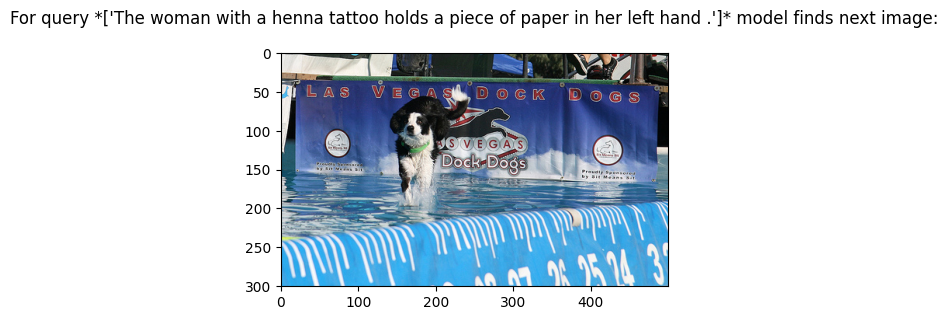

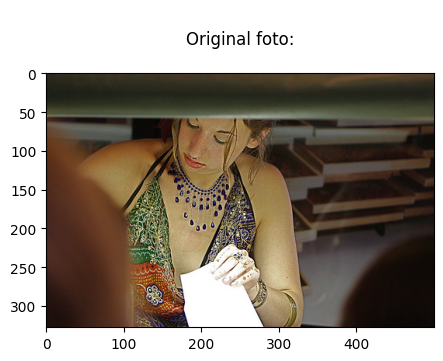

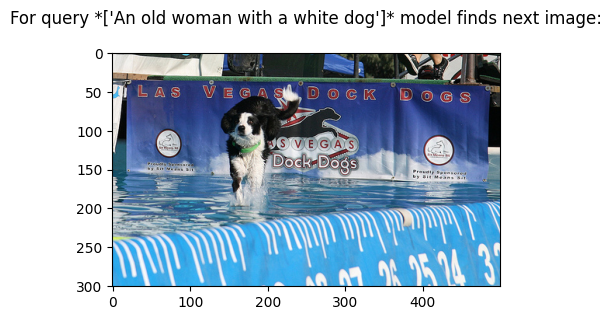

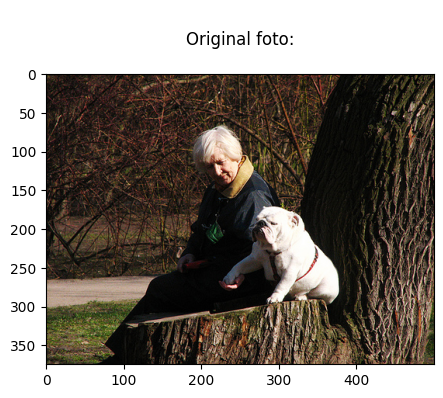

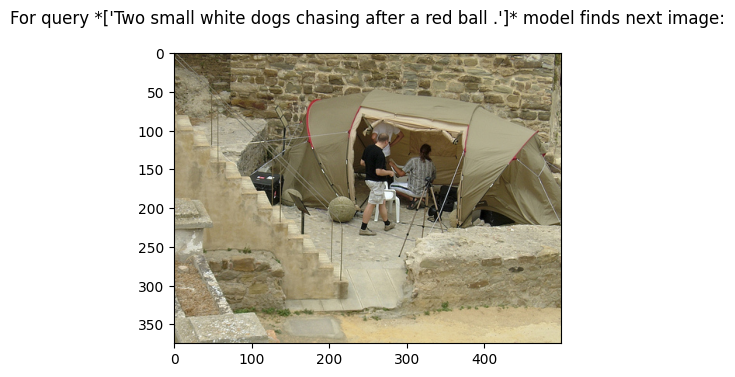

...

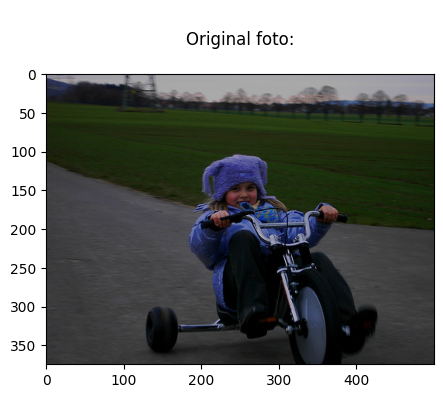

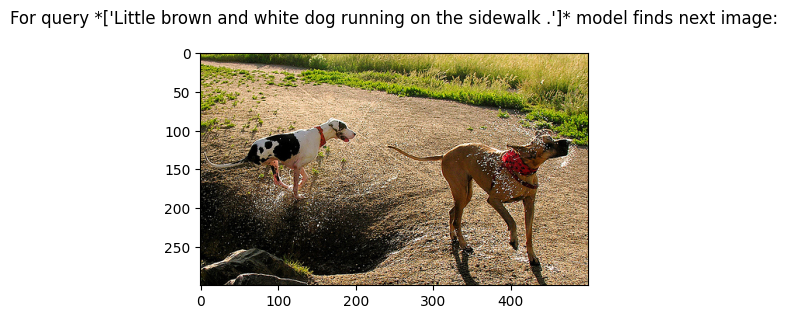

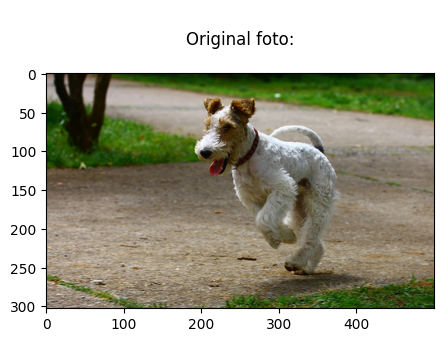

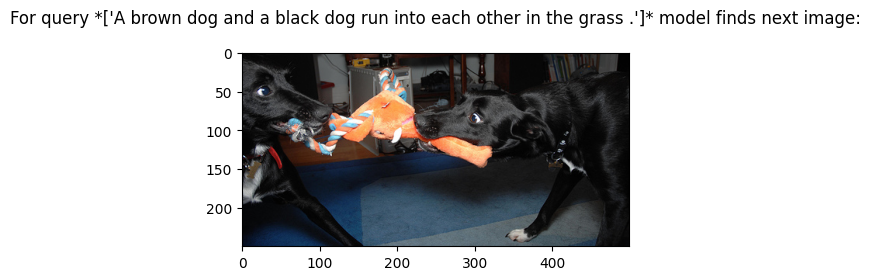

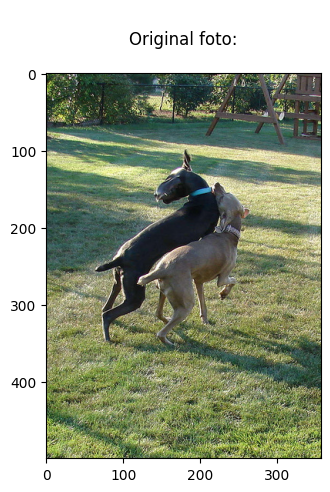

In [ ]:
for i in range(10):
    query_line=q_test.sample(1)
    query = query_line['query_text'].tolist()
    name_foto_origin = query_line['image'].tolist()[0]
    this_foto(query)

<a id="18"></a>
### CLIP

Использую рекомендованную библиотеку sbert. Переписала функцию поиска изображения и эмбендинга фото - они теперь делаются по одному. Потом берётся обработанный моделью запрос, и с каждым изображением высчитывается расстояние, которое записывается в массив, который в дальнейшем я использую вместо предсказаний. Сортирую также по убыванию.

In [ ]:
from sentence_transformers import SentenceTransformer, util

#Load CLIP model
model = SentenceTransformer('clip-ViT-B-32')





In [ ]:
def embed_foto(path1, images, arr, text_emb):
    for i in range(len(images)):
        img = Image.open(Path(path, path1, images[i])).convert('RGB')
        #Encode an image CLIP:
        img_emb = model.encode(img)
        #Compute cosine similarities CLIP
        cos_scores = util.cos_sim(img_emb, text_emb)
        arr.append(cos_scores)
    return arr

In [ ]:
def this_foto_CLIP(query):

    line = clr_line(query)
    if is_stop(line):
        print(f'\nFor query *{query}* model can\'t find image:\n')
        print('This image is unavailable in your country.\n')
    else:
        #Encode text descriptions CLIP
        text_emb = model.encode([line])
        scores = []
        scores = embed_foto(path3, fot_test, scores, text_emb)

        df_to_choose_foto['scores'] = scores
        df = df_to_choose_foto.sort_values(by='scores', ascending=False)
        line = df.head(1)
        name_foto = line['image'].tolist()[0]
    # вывод изображения
        fig = plt.figure(figsize=(5,5))
        image = Image.open(Path(path, path3, name_foto))
        plt.imshow(image)
        plt.title(f'For query *{query}* model finds next image:\n')

    # вывод исходного изображения
        fig = plt.figure(figsize=(5,5))
        image = Image.open(Path(path, path3, name_foto_origin))
        plt.imshow(image)
        plt.title(f'\nOriginal foto:\n')
        print('\n\n')


For query *['A boy on a BMX bike']* model can't find image:

This image is unavailable in your country.


For query *['Boy flings mud at girl']* model can't find image:

This image is unavailable in your country.



























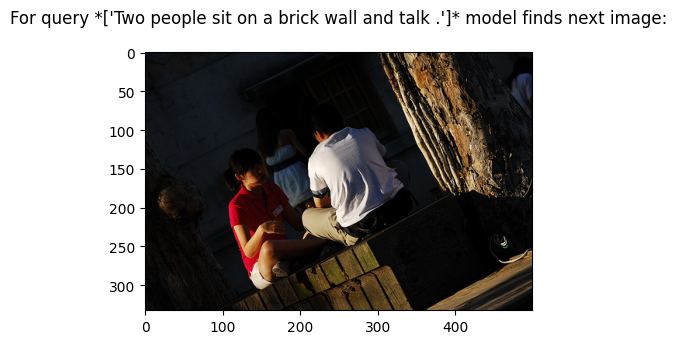

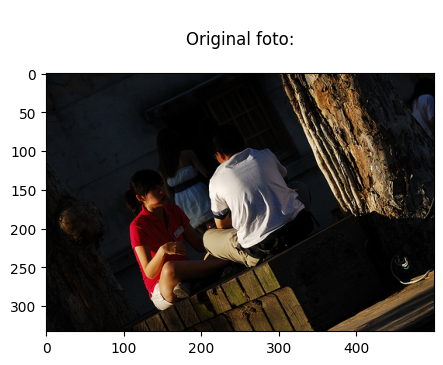

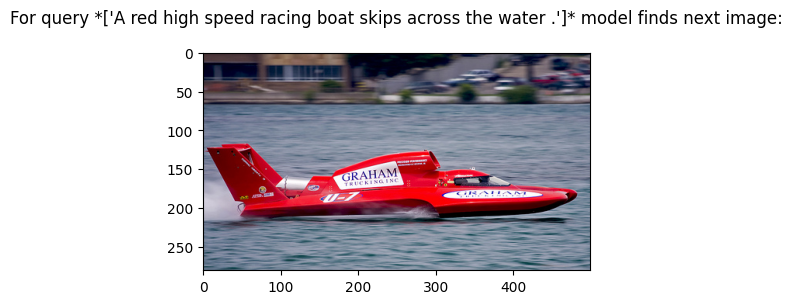

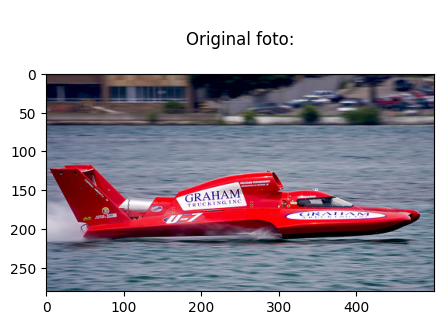

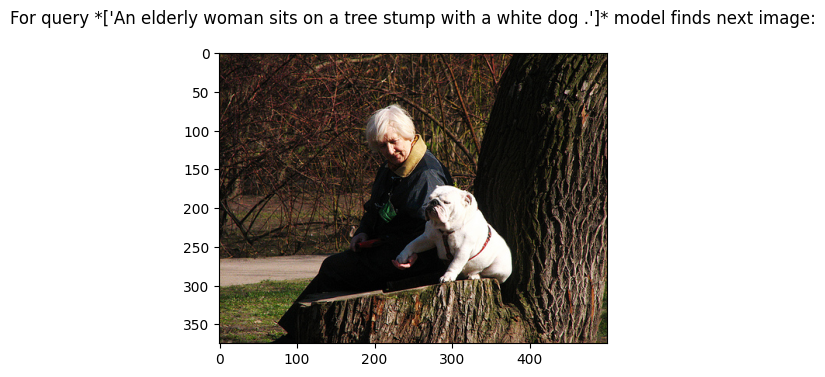

...

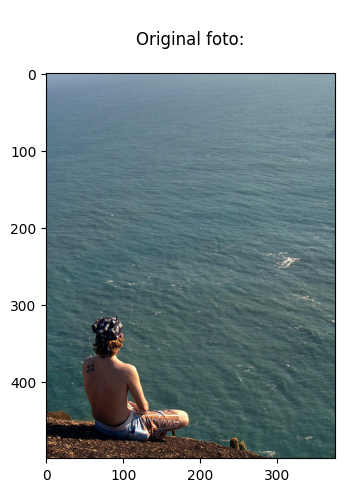

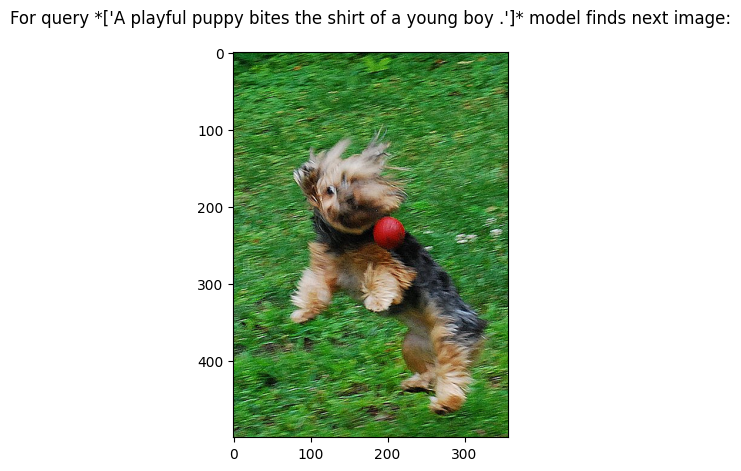

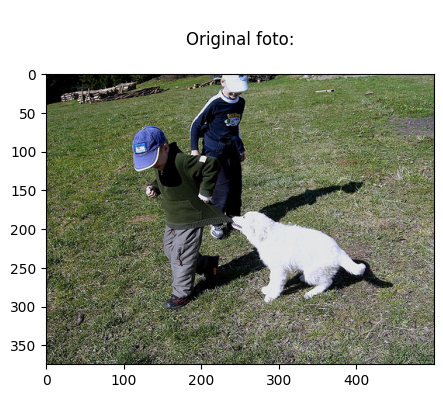

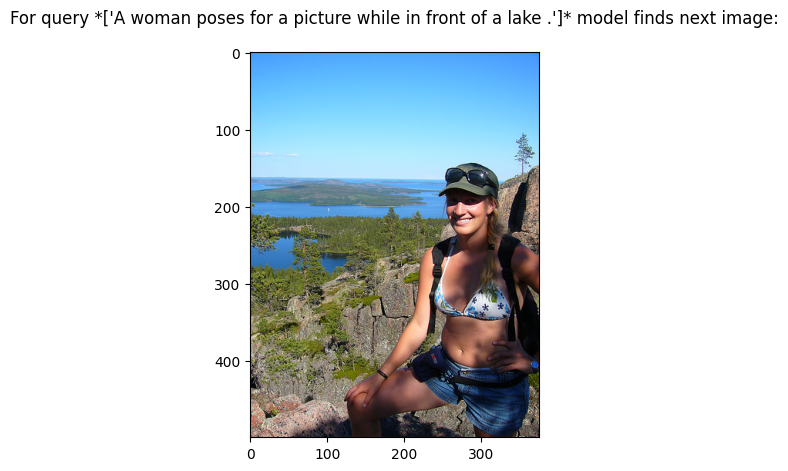

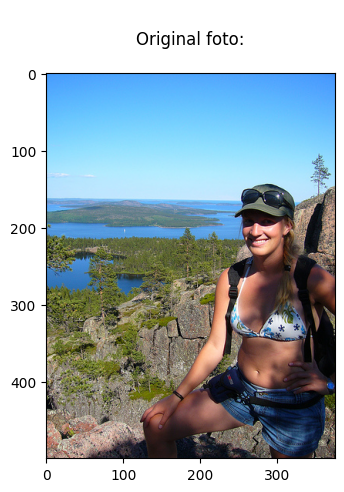

In [ ]:
for i in range(10):
    query_line=q_test.sample(1)
    query = query_line['query_text'].tolist()
    name_foto_origin = query_line['image'].tolist()[0]
    this_foto_CLIP(query)


<a id="17"></a>
## Вывод

Подбор изображений с помощью подхода CLIP работает довольно точно. Можно предлагать заказчику этот метод.